In [ ]:
%matplotlib inline
import librosa, matplotlib.pyplot as plt, IPython.display as ipd, numpy
import scipy.spatial

In [ ]:
import os, sys
![../../mirdotcom.py] || wget -N https://raw.githubusercontent.com/iranroman/musicinformationretrieval.com/refs/heads/gh-pages/mirdotcom.py
if os.path.isfile("../../mirdotcom.py"):
    sys.path.extend("../../mirdotcom.py")
import mirdotcom; mirdotcom.init()

[&larr; Back to Index](https://musicinformationretrieval.com/index.html)

# Music Structure Analysis

In progress.

Method:

- self similarity matrix

In [42]:
y, sr = librosa.load('assets/audio/brahms_hungarian_dance_5.mp3')

In [43]:
ipd.Audio(y, rate=sr)

### Chroma

In [56]:
hop_length = 8000
n_fft = 2**14

In [45]:
chroma = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length, n_fft=n_fft)

In [46]:
chroma.shape

(12, 628)

### MFCC

In [57]:
mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=10, hop_length=hop_length, n_fft=n_fft)

In [58]:
mfcc.shape

(10, 628)

### Self Similarity

In [71]:
self_similarity = scipy.spatial.distance_matrix(mfcc.T, mfcc.T, p=1)

In [72]:
self_similarity.shape

(628, 628)

[]

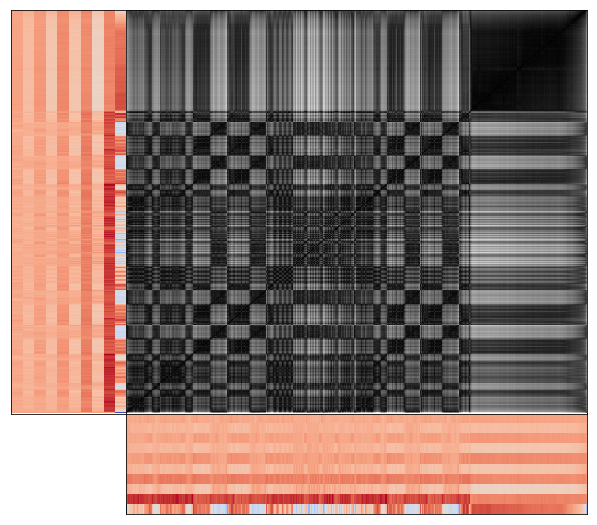

In [73]:
plt.figure(figsize=(8, 7))

# Bottom right plot.
ax1 = plt.axes([0.2, 0, 0.8, 0.20])
ax1.imshow(mfcc, origin='lower', aspect='auto', cmap='coolwarm')
#ax1.set_xlabel('Chroma')
ax1.set_xticks([])
ax1.set_yticks([])
#ax1.set_ylim(20)

# Top left plot.
ax2 = plt.axes([0, 0.2, 0.20, 0.8])
ax2.imshow(mfcc.T[:,::-1], origin='lower', aspect='auto', cmap='coolwarm')
#ax2.set_ylabel('Signal 2')
ax2.set_xticks([])
ax2.set_yticks([])
#ax2.set_ylim(20)

# Top right plot.
#ax3 = plt.axes([0.2, 0.2, 0.8, 0.8], sharex=ax1, sharey=ax2)
ax3 = plt.axes([0.2, 0.2, 0.8, 0.8])
ax3.imshow(self_similarity.T, aspect='auto', origin='lower', interpolation='nearest', cmap='gray')
ax3.set_xticks([])
ax3.set_yticks([])

Path enhancement 

1. diagonal smoothing
1. multiple filtreing
1. thresholding every element
1. scaling and penalty

Path extraction

## Novelty based segmentation

checkerboard kernel along the main diagonal

Take a first-order difference along each row.

In [119]:
similarity_delta = librosa.feature.delta(self_similarity, width=11, axis=1)

In [120]:
similarity_delta.shape

(628, 628)

In [121]:
similarity_diff = abs(similarity_delta)

In [82]:
similarity_diff = abs(numpy.diff(self_similarity))

In [83]:
similarity_diff.shape

(628, 627)

Sum the absolute values of the differences across columns.

In [122]:
novelty = similarity_diff.sum(axis=0)

In [123]:
novelty.shape

(628,)

Normalize novelty curve.

In [124]:
novelty = novelty/novelty.max()

In [125]:
novelty.max()

1.0

In [126]:
novelty.min()

0.0045691969880727835

Peak pick.

In [127]:
min_segment_length_sec = 10
min_segment_length_frames = librosa.time_to_frames(10, sr=sr, hop_length=hop_length, n_fft=n_fft)
min_segment_length_frames

26

In [130]:
peaks = librosa.onset.onset_detect(onset_envelope=novelty, hop_length=hop_length, 
                                   pre_max=11, post_max=11,
                                   pre_avg=11, post_avg=11,
                                   wait=min_segment_length_frames)
peaks

array([  5,  36,  91, 137, 168, 230, 261, 290, 355, 401, 430, 471, 622])

Plot.

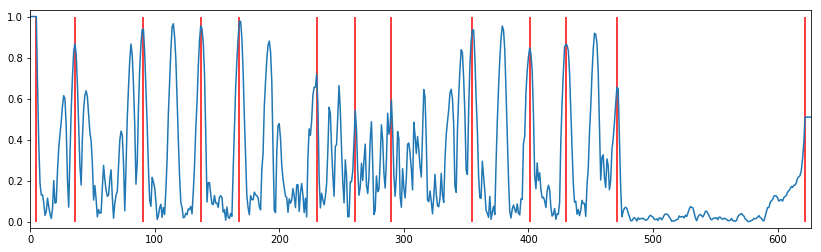

In [132]:
plt.figure(figsize=(14, 4))
plt.plot(novelty)
plt.vlines(peaks, 0, 1, colors='r')

In [134]:
librosa.frames_to_time(peaks, sr=sr, hop_length=hop_length)

array([  1.81405896,  13.06122449,  33.01587302,  49.70521542,
        60.95238095,  83.44671202,  94.69387755, 105.2154195 ,
       128.79818594, 145.48752834, 156.00907029, 170.88435374,
       225.66893424])

[&larr; Back to Index](https://musicinformationretrieval.com/index.html)